# Anime characters eye detection and segment using Yolov8/
##Introduction to Yolov8:

YOLOv8, short for "You Only Look Once Version 8," is a cutting-edge real-time object detection model renowned for its efficiency and excellence in the field of object detection.

YOLOv8 adopts a tiered and cascading network architecture, comprising multiple convolutional layers and feature pyramids. This architecture efficiently captures object details across various scales. Additionally, the model incorporates innovative methods like SAM (Segmentation Aware Modules) to enhance target segmentation performance.

## Goal
In this notebook, we will first employ YOLOv8 for object detection, followed by segmentation based on the detected results. Subsequently, we will present and analyze the outcomes of these processes.

## Preparation to run code
1. download the dataset from https://universe.roboflow.com/erentil/both-eyes-anime/dataset/2 and upload the zip file, or you can use the code on the website to download it
2. change the path of the train, test, valid in data.yaml under the folder.

In [1]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [2]:
!pip install ultralytics
# or download it from source
# !git clone https://github.com/ultralytics/ultralytics
# !cd ultralytics
# !pip install -e ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 8.0 MB/s eta 0:00:00


upload the dataset zip file here, and unzip it./**don't forget to change the path of the data.yaml**

In [3]:
# !unzip /content/both-eyes-anime.v2-version-2.-2023-05-27-11-06pm.yolov8.zip -d both-eyes-anime-2
!unzip /content/both-eyes-anime.v2-version-2.-2023-05-27-11-06pm.yolov8.zip -d both-eyes-anime-2 > /dev/null


# Training process

Load the model and configuration from the libaray, and train them with our dataset

In [4]:
from ultralytics import YOLO

# Load the model and configuration from the libaray
model = YOLO('yolov8n.yaml')  # create a new model from yaml
model = YOLO('yolov8n.pt')   # load the pre-trained model
model = YOLO('yolov8n.yaml').load('yolov8n.pt')

#training process
# train it for 300 epoches, since we have only one class - set single_cls
results = model.train(data='/content/both-eyes-anime-2/data.yaml', epochs=300, imgsz=640, single_cls=True, resume=True)



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 6.23M/6.23M [00:00<00:00, 136MB/s]


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

YOLOv8n summary: 225 layers, 3157200 parameters, 3157184 gradients, 8.9 GFLOPs

Transferred 355/355 items from pretrained weights
Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/both-eyes-anime-2/data.yaml, epochs=300, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=None, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_fram

100%|██████████| 755k/755k [00:00<00:00, 23.5MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/both-eyes-anime-2/train/labels... 98 images, 0 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:00<00:00, 1087.07it/s]

train: New cache created: /content/both-eyes-anime-2/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/both-eyes-anime-2/valid/labels... 15 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15/15 [00:00<00:00, 1260.94it/s]

val: New cache created: /content/both-eyes-anime-2/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300       2.3G      2.486      4.347      1.885          5        640: 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

                   all         15         27    0.00133      0.222    0.00206   0.000729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300      2.32G      1.894      3.541       1.46          7        640: 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.05it/s]

                   all         15         27    0.00444      0.741      0.041     0.0168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      2.33G      1.593      2.579      1.264          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all         15         27    0.00489      0.815     0.0448     0.0172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      2.33G      1.597      2.331      1.241          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all         15         27    0.00489      0.815     0.0447     0.0267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300      2.33G       1.51       1.82      1.164          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.10it/s]

                   all         15         27    0.00444      0.741     0.0413      0.014



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      2.32G      1.467      2.028      1.261          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.95it/s]

                   all         15         27      0.616      0.037     0.0385    0.00513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      2.33G      1.404      1.592      1.193          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.31it/s]

                   all         15         27    0.00356      0.593      0.115     0.0752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      2.34G      1.375      1.563      1.192          8        640: 100%|██████████| 7/7 [00:00<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.01it/s]

                   all         15         27    0.00333      0.556      0.131     0.0856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      2.34G      1.459      1.748      1.305          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.51it/s]

                   all         15         27    0.00311      0.519     0.0172    0.00917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      2.32G      1.409      1.727      1.196         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.67it/s]


                   all         15         27    0.00311      0.519    0.00421    0.00226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300      2.34G      1.402      1.521      1.233          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

                   all         15         27    0.00468      0.519     0.0327     0.0179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      2.36G      1.388      1.511      1.238          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.26it/s]

                   all         15         27       0.53      0.037      0.055     0.0307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      2.34G      1.717      2.799      1.318          1        640: 100%|██████████| 7/7 [00:00<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.66it/s]

                   all         15         27      0.103      0.222      0.088     0.0433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      2.33G       1.39      1.467      1.185          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

                   all         15         27      0.461      0.259       0.26      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      2.32G      1.366      1.438      1.178          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]

                   all         15         27      0.508      0.407      0.329      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      2.33G      1.338      1.271      1.185          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]

                   all         15         27      0.915      0.222      0.295      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      2.34G      1.443      1.383      1.217          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.19it/s]

                   all         15         27      0.777      0.259      0.282      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      2.32G        1.6      1.529       1.33          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]


                   all         15         27          1      0.214      0.268       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      2.32G      1.368      1.196      1.171         13        640: 100%|██████████| 7/7 [00:00<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.63it/s]

                   all         15         27       0.82      0.519      0.512      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      2.34G      1.415      1.123      1.225         12        640: 100%|██████████| 7/7 [00:00<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.44it/s]

                   all         15         27      0.933      0.516      0.568      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      2.34G      1.317      1.137        1.2          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]

                   all         15         27      0.821      0.519      0.557      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      2.33G      1.369       1.52      1.225          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

                   all         15         27      0.916      0.481      0.615      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      2.33G      1.236      1.068      1.111          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]


                   all         15         27      0.875      0.407      0.502      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300      2.33G      1.355      1.109      1.203          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.87it/s]

                   all         15         27      0.922      0.437      0.486      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300      2.36G      1.338       1.11      1.146          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]


                   all         15         27      0.876      0.444      0.477      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300      2.32G      1.232      1.046      1.135          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.53it/s]

                   all         15         27      0.976      0.444      0.486      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300       2.3G      1.142       1.03        1.1          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

                   all         15         27      0.801      0.481      0.542      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      2.34G      1.254      1.007       1.14          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.67it/s]

                   all         15         27      0.823      0.444      0.532       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300      2.36G      1.243     0.9652      1.123         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.77it/s]


                   all         15         27      0.746      0.444      0.528      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300      2.32G      1.242     0.9352      1.144          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

                   all         15         27      0.822      0.512      0.535      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300      2.33G      1.172     0.9895      1.138          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.00it/s]

                   all         15         27      0.767      0.444      0.524      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300      2.34G      1.309     0.9264      1.134         14        640: 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.47it/s]

                   all         15         27        0.9      0.333       0.45      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300      2.34G      1.233     0.9245      1.097          5        640: 100%|██████████| 7/7 [00:00<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.10it/s]

                   all         15         27      0.676       0.37      0.447      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300      2.32G      1.161     0.9664      1.136          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.99it/s]

                   all         15         27      0.658      0.333      0.397      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300      2.32G      1.228     0.9586      1.187          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.50it/s]

                   all         15         27      0.661      0.333      0.431      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300      2.32G      1.217     0.9248      1.151         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.08it/s]

                   all         15         27       0.98      0.333      0.445      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300      2.33G      1.118     0.9147      1.091          1        640: 100%|██████████| 7/7 [00:00<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.63it/s]


                   all         15         27      0.668      0.407      0.465      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300      2.32G       1.21     0.8697      1.135          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all         15         27      0.832      0.407       0.53      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300      2.31G      1.192     0.8461      1.103         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]


                   all         15         27      0.633      0.556      0.562      0.288

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300      2.33G      1.234     0.8471      1.185          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.77it/s]

                   all         15         27      0.839      0.407      0.521      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      2.34G      1.251     0.8582      1.101          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.73it/s]

                   all         15         27      0.778      0.407      0.526      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300      2.32G      1.229     0.8391      1.162          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.71it/s]


                   all         15         27      0.527      0.519      0.501      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300      2.34G       1.22     0.8435      1.198          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]

                   all         15         27      0.479      0.704      0.603       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      2.32G      1.129     0.9246      1.104          1        640: 100%|██████████| 7/7 [00:00<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

                   all         15         27      0.698      0.514      0.636      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      2.32G       1.12      0.766      1.107          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.67it/s]

                   all         15         27      0.792      0.444       0.58      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      2.34G      1.192     0.7829       1.09         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]

                   all         15         27      0.928      0.478      0.616      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300      2.29G      1.241     0.8748      1.163          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.02it/s]

                   all         15         27      0.837      0.556      0.672       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300      2.32G      1.197     0.8243      1.131          8        640: 100%|██████████| 7/7 [00:00<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all         15         27      0.776      0.514      0.645      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      2.32G      1.148     0.7943      1.081          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.55it/s]

                   all         15         27      0.799      0.444      0.545      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      2.34G      1.147     0.7524      1.038          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.34it/s]

                   all         15         27      0.746      0.519      0.599      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300      2.34G       1.12     0.7636      1.153          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.83it/s]


                   all         15         27      0.815      0.654      0.699      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300      2.35G      1.194      0.765      1.109          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.06it/s]

                   all         15         27      0.841      0.586      0.701      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      2.32G      1.221     0.9746      1.137          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.61it/s]

                   all         15         27      0.919      0.519      0.655      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300      2.34G      1.138     0.7151      1.092         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]

                   all         15         27      0.686      0.649      0.649      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300      2.33G      1.117     0.7874      1.074          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]

                   all         15         27      0.748      0.549      0.645      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      2.33G      1.098     0.7272      1.059         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.30it/s]

                   all         15         27      0.922       0.44      0.635      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300      2.34G       1.15     0.7522      1.108          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.99it/s]

                   all         15         27      0.911      0.519      0.621      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      2.32G      1.051     0.6682      1.049          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.64it/s]


                   all         15         27      0.963       0.37      0.525      0.296

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      2.31G      1.112     0.7349      1.114          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.56it/s]

                   all         15         27      0.653      0.333      0.403      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300      2.32G      1.099     0.7052      1.102          8        640: 100%|██████████| 7/7 [00:00<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

                   all         15         27      0.823      0.407      0.539      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300      2.34G      1.079     0.7026      1.056          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.33it/s]

                   all         15         27      0.738      0.556       0.59      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      2.32G      1.097     0.7116      1.078         14        640: 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.38it/s]

                   all         15         27      0.908      0.444      0.566      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300      2.29G      1.035     0.6772       1.05          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.11it/s]

                   all         15         27      0.879      0.537      0.626      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      2.32G      1.028     0.7166      1.053          1        640: 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

                   all         15         27      0.926      0.467      0.602      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300      2.32G      1.024      0.668      1.041          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.00it/s]

                   all         15         27      0.863      0.519      0.608      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300      2.32G     0.9917     0.6883      1.063          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.17it/s]

                   all         15         27      0.933      0.513      0.621      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300       2.3G      1.102      0.719      1.059          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.82it/s]

                   all         15         27      0.932      0.509       0.64      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300      2.32G      1.011     0.6691      1.045         14        640: 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.73it/s]

                   all         15         27      0.972      0.444      0.575      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      2.34G      1.071     0.6809      1.098          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

                   all         15         27      0.724      0.519      0.571      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300      2.32G       1.15     0.7418      1.101         12        640: 100%|██████████| 7/7 [00:00<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

                   all         15         27      0.676      0.556      0.574      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300       2.3G       1.14     0.7035      1.069          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.70it/s]

                   all         15         27      0.871      0.499      0.631      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300      2.32G      1.058     0.7041      1.071          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.29it/s]

                   all         15         27          1      0.473      0.649      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300      2.32G      1.139     0.6894       1.07         13        640: 100%|██████████| 7/7 [00:00<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.81it/s]

                   all         15         27      0.856      0.519      0.631      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300      2.32G      1.005      0.642      1.009          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

                   all         15         27      0.794      0.593      0.634      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300      2.33G     0.9925     0.6208      1.043          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]

                   all         15         27      0.775      0.509      0.569      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300      2.32G      1.011     0.6795      1.039         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.44it/s]

                   all         15         27      0.904      0.407      0.504      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      2.32G      1.007     0.5911      0.996         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

                   all         15         27      0.867      0.407       0.52      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300       2.3G      1.039       0.68      1.039         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.61it/s]

                   all         15         27      0.746      0.481      0.537      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      2.31G      1.052     0.6737      1.032         15        640: 100%|██████████| 7/7 [00:00<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

                   all         15         27      0.803      0.481      0.632      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300      2.32G      1.036     0.6308      1.037          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

                   all         15         27      0.761       0.59      0.688      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300       2.3G     0.9582     0.6082      1.033          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.06it/s]

                   all         15         27      0.735      0.617      0.671       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      2.32G      1.005     0.5747       1.04          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

                   all         15         27      0.881      0.519       0.64      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300      2.31G     0.9932     0.6307      1.023          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.23it/s]

                   all         15         27      0.924      0.556      0.655      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300       2.3G     0.9404      0.672      1.002          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.03it/s]

                   all         15         27      0.978      0.519      0.657      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300      2.34G     0.9442     0.5693     0.9823          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]

                   all         15         27      0.992      0.519      0.634      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300      2.32G     0.9746     0.6163      1.018          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.61it/s]

                   all         15         27      0.901      0.481      0.546      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300       2.3G     0.9444     0.5884     0.9858          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

                   all         15         27      0.894      0.481      0.549      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300      2.32G      1.043      0.626      1.043         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

                   all         15         27       0.99      0.556      0.625      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      2.32G      1.062     0.6299      1.075          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.26it/s]


                   all         15         27      0.942      0.599       0.67      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300      2.32G     0.9946     0.6127      1.032          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

                   all         15         27      0.742      0.638      0.692      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      2.31G      1.063     0.6489      1.109          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.02it/s]

                   all         15         27      0.707      0.625      0.667      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300      2.34G      0.966     0.6134      1.024          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.68it/s]

                   all         15         27      0.683      0.559      0.633      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300      2.32G      1.032     0.5992      1.049          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]

                   all         15         27       0.68      0.628      0.686      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      2.32G     0.9887     0.6467      1.017          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.74it/s]

                   all         15         27      0.773      0.556      0.693      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300      2.33G     0.9611     0.5955      1.029          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.16it/s]

                   all         15         27      0.921      0.556      0.707      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300      2.32G      1.195      1.069      1.062          1        640: 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]

                   all         15         27      0.841      0.667      0.722        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300      2.32G     0.9254     0.6004      1.004          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.33it/s]

                   all         15         27      0.862      0.692      0.746      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300      2.32G     0.9401     0.6327     0.9927          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

                   all         15         27      0.792      0.703      0.791      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      2.31G     0.9568     0.6644     0.9942          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

                   all         15         27      0.761      0.741       0.78      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300      2.32G      0.971     0.6187      1.018          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.06it/s]

                   all         15         27      0.785      0.741      0.757      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300      2.32G     0.9318     0.5785      0.992          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.61it/s]

                   all         15         27      0.805      0.704      0.757      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300      2.34G      1.086     0.6249      1.037          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.26it/s]

                   all         15         27       0.88       0.63      0.731      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      2.31G     0.9548     0.6084      1.057          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.60it/s]

                   all         15         27      0.895      0.667      0.737      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      2.21G     0.9192     0.5817     0.9573         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]

                   all         15         27      0.894      0.667      0.703      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300      2.32G     0.9226      0.572     0.9786         13        640: 100%|██████████| 7/7 [00:00<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]


                   all         15         27      0.892      0.667      0.702      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      2.32G      1.055     0.6172      1.105          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]


                   all         15         27      0.714      0.667      0.665      0.359

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300      2.31G     0.9601     0.5785      1.003          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.30it/s]

                   all         15         27      0.873      0.511       0.62      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300      2.32G     0.9868      0.628      1.045         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.13it/s]

                   all         15         27      0.802      0.519      0.638      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300      2.32G      1.045     0.6036      1.001          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.86it/s]

                   all         15         27      0.881      0.546      0.643       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300      2.32G     0.9519     0.5814     0.9974         11        640: 100%|██████████| 7/7 [00:00<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.72it/s]

                   all         15         27      0.871      0.519      0.657      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      2.31G     0.9986     0.5688       1.02          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]


                   all         15         27      0.825      0.593      0.669      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300       2.3G     0.9861     0.6461       0.98          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.05it/s]

                   all         15         27      0.922      0.556      0.679      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300      2.32G     0.9244     0.5873      1.026          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

                   all         15         27      0.929      0.556      0.687      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300      2.32G     0.8868     0.5689      1.017          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

                   all         15         27      0.925      0.556        0.7      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      2.31G     0.9763      0.588      1.037          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

                   all         15         27      0.975      0.556      0.738      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      2.32G     0.9428     0.5738     0.9824          8        640: 100%|██████████| 7/7 [00:00<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.61it/s]

                   all         15         27      0.882      0.555      0.711      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300      2.32G      0.936     0.6192      1.017          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.38it/s]

                   all         15         27      0.928      0.481      0.675      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300      2.32G     0.9529     0.5874      1.001          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.54it/s]

                   all         15         27      0.928      0.476      0.592      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300      2.31G     0.9569     0.5649      1.004          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.39it/s]

                   all         15         27      0.865      0.475      0.594      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300      2.34G     0.7231     0.9589     0.8195          0        640: 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.49it/s]

                   all         15         27      0.865      0.475      0.553      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      2.32G     0.8633     0.5485     0.9564          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

                   all         15         27      0.825      0.444      0.525      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300      2.32G      0.925     0.5631     0.9991          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.12it/s]

                   all         15         27      0.812       0.48      0.547      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300      2.31G     0.9438     0.5891      0.993          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.30it/s]

                   all         15         27      0.852      0.481      0.595      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300      2.32G      0.836     0.5542     0.9499          7        640: 100%|██████████| 7/7 [00:00<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

                   all         15         27        0.8      0.593      0.663      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300      2.32G      0.884     0.5702     0.9559          8        640: 100%|██████████| 7/7 [00:00<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.77it/s]

                   all         15         27      0.746      0.667      0.674      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      2.32G     0.8794     0.5584     0.9651          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.34it/s]

                   all         15         27      0.844       0.63       0.67      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      2.31G     0.8529     0.5334      0.933          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.10it/s]


                   all         15         27      0.802      0.704        0.7      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300      2.34G     0.8709     0.5216     0.9557         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

                   all         15         27      0.853      0.644      0.719      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      2.32G     0.9255     0.5511      1.021          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.22it/s]

                   all         15         27       0.84      0.583      0.696        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      2.32G     0.8791     0.5262     0.9461          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.67it/s]

                   all         15         27      0.743      0.593      0.644      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300      2.31G     0.8191     0.4842     0.9622         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.26it/s]

                   all         15         27      0.877      0.593      0.682      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300      2.32G      0.921     0.5428     0.9703          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

                   all         15         27          1      0.586      0.681      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300      2.34G      0.816     0.4777     0.9413          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.25it/s]

                   all         15         27      0.816       0.63       0.68      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      2.34G     0.8183     0.5463     0.9882          2        640: 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]

                   all         15         27          1      0.591      0.703      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300      2.33G     0.7986     0.5195     0.9637          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

                   all         15         27      0.894      0.627      0.705      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      2.34G     0.8768     0.6141     0.9539          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

                   all         15         27      0.888      0.585       0.65      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      2.35G     0.9076      0.529     0.9676          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

                   all         15         27      0.928      0.519       0.62       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300      2.34G     0.8446     0.5244     0.9553          8        640: 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.64it/s]

                   all         15         27      0.928      0.519      0.654      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      2.31G     0.8505     0.4892     0.9562         10        640: 100%|██████████| 7/7 [00:00<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]

                   all         15         27       0.99      0.481      0.683      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      2.32G     0.8028     0.5157     0.9524          4        640: 100%|██████████| 7/7 [00:00<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

                   all         15         27      0.819      0.556      0.657      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      2.32G     0.8608     0.5013     0.9793          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.80it/s]


                   all         15         27       0.83      0.556      0.683      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300      2.34G     0.7815     0.4867     0.9457          5        640: 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.48it/s]


                   all         15         27      0.811      0.637       0.69      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      2.33G     0.7911     0.5532     0.9531          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.26it/s]

                   all         15         27      0.889      0.592       0.68      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300      2.34G     0.7888     0.4905     0.9199          3        640: 100%|██████████| 7/7 [00:00<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.87it/s]

                   all         15         27       0.92      0.556      0.669      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300       2.3G     0.8856     0.5424     0.9893          9        640: 100%|██████████| 7/7 [00:00<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.64it/s]

                   all         15         27      0.745      0.649      0.671      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300      2.32G     0.7897     0.5052     0.9367         12        640: 100%|██████████| 7/7 [00:00<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.77it/s]

                   all         15         27      0.882      0.593      0.703      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300      2.31G     0.8082     0.4901     0.9337          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.72it/s]


                   all         15         27      0.847      0.618      0.712      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300      2.34G     0.8037      0.498      0.945          6        640: 100%|██████████| 7/7 [00:00<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.15it/s]

                   all         15         27      0.798      0.586       0.63      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300      2.34G     0.7652     0.5001     0.9398         12        640: 100%|██████████| 7/7 [00:00<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.54it/s]

                   all         15         27      0.796      0.579      0.627      0.382


Stopping training early as no improvement observed in last 50 epochs. Best results observed at epoch 99, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

149 epochs completed in 0.061 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.04it/s]


                   all         15         27      0.759      0.741       0.78      0.429
Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train


# Result analysis
In the code below, we use demonstrate performance of our model

Loss




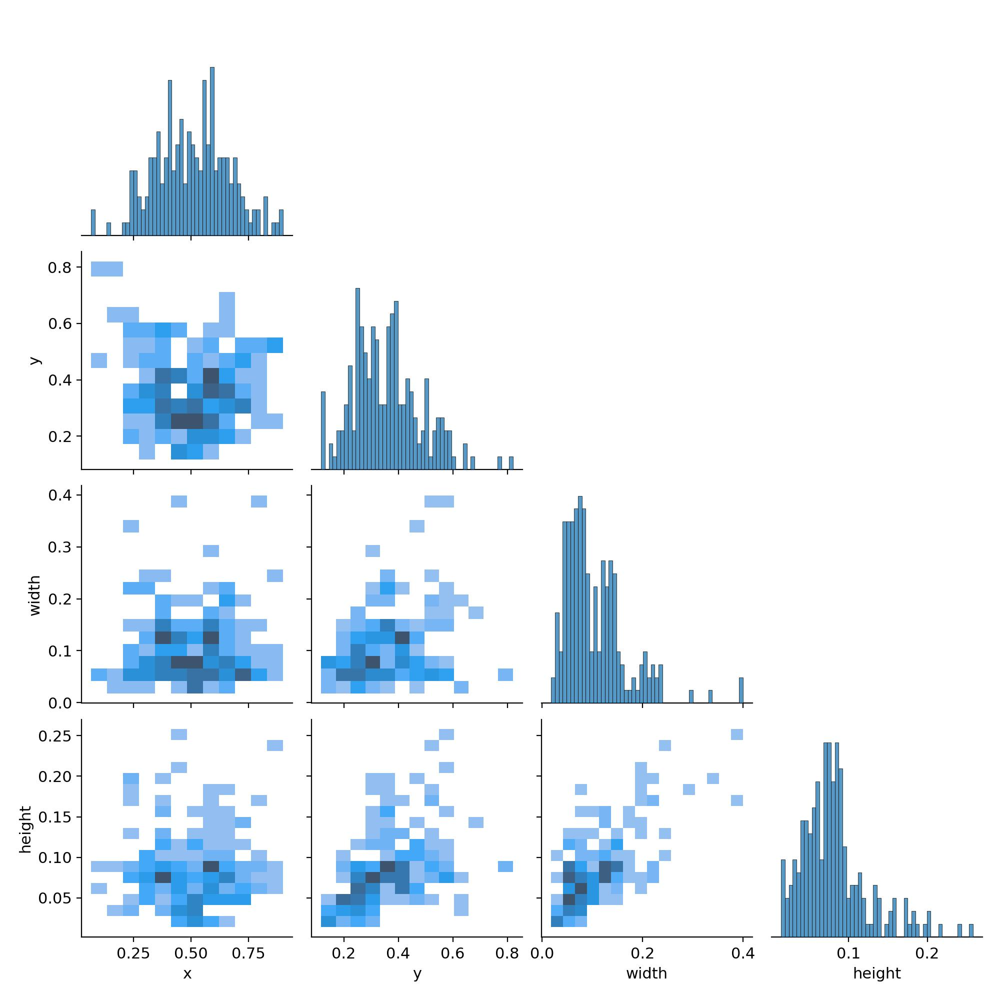

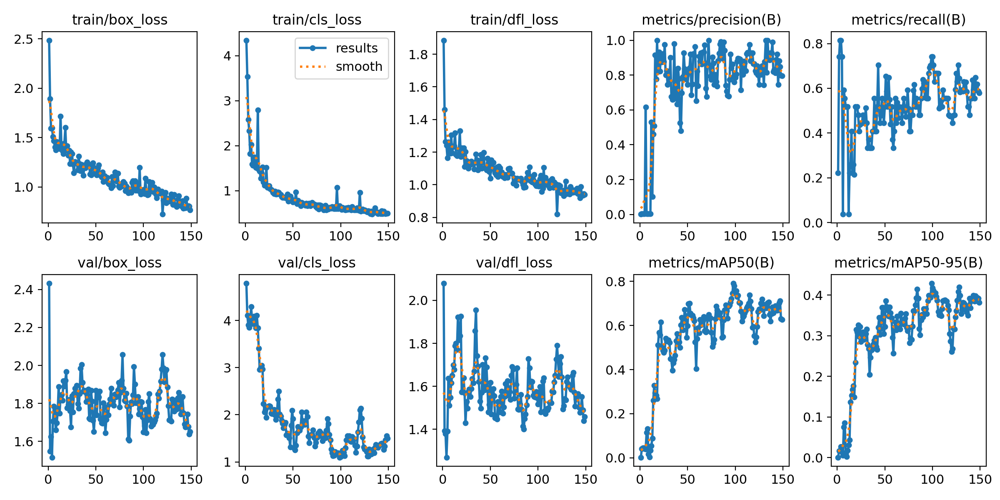

In [5]:
from IPython.display import Image
import os

outputs_dir = '/content/runs/detect/train'
image_path = os.path.join(outputs_dir, 'labels_correlogram.jpg')
display(Image(filename=image_path))
image_path = os.path.join(outputs_dir, 'results.png')
display(Image(filename=image_path))

PR_curve.png

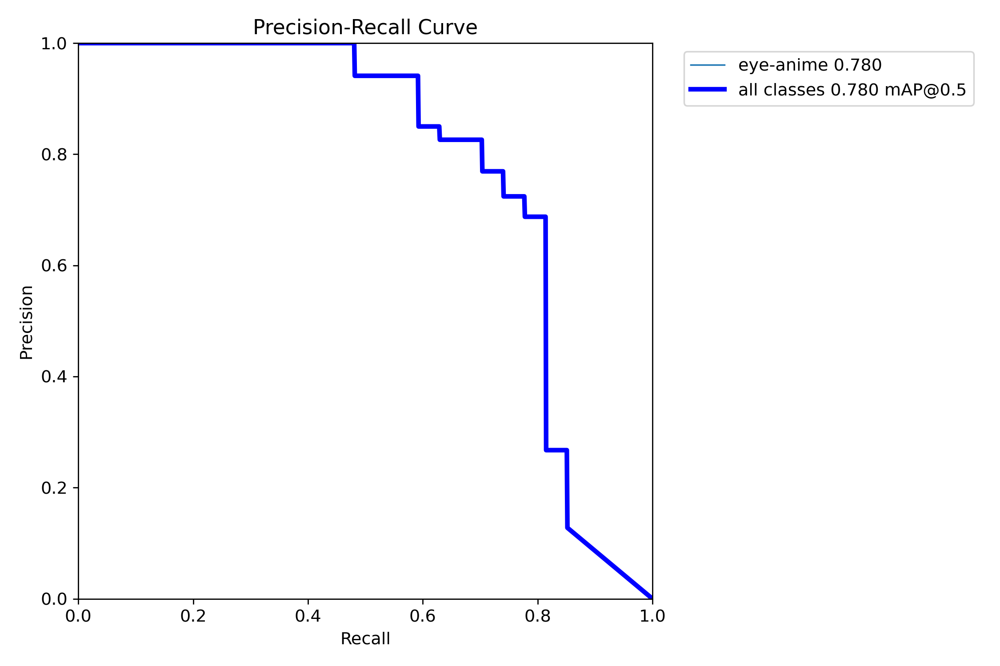

In [6]:
image_path = os.path.join(outputs_dir, 'PR_curve.png')
display(Image(filename=image_path))

## Visual results
we select a few images and implement our model to predict.


image 1/8 /content/data/miss_yolu1.png: 512x640 1 eye-anime, 71.6ms
image 2/8 /content/data/miss_yolu2.png: 384x640 6 eye-animes, 66.6ms
image 3/8 /content/data/miss_yolu3.png: 640x352 5 eye-animes, 60.0ms
image 4/8 /content/data/miss_yolu4.png: 640x640 2 eye-animes, 11.1ms
image 5/8 /content/data/miss_yolu5.png: 640x480 6 eye-animes, 60.7ms
image 6/8 /content/data/miss_yolu6.png: 640x480 4 eye-animes, 9.0ms
image 7/8 /content/data/miss_yolu7.png: 640x640 2 eye-animes, 10.5ms
image 8/8 /content/data/miss_yolu8.png: 384x640 2 eye-animes, 9.4ms
Speed: 2.3ms preprocess, 37.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Time used: 0.08055093884468079 second


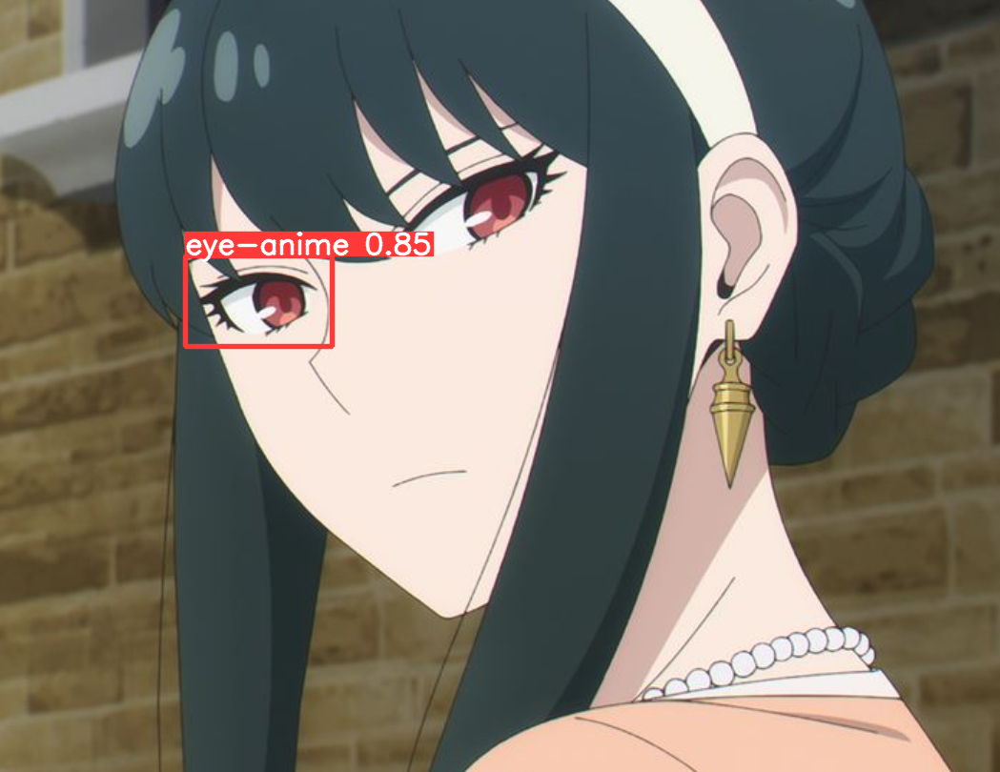

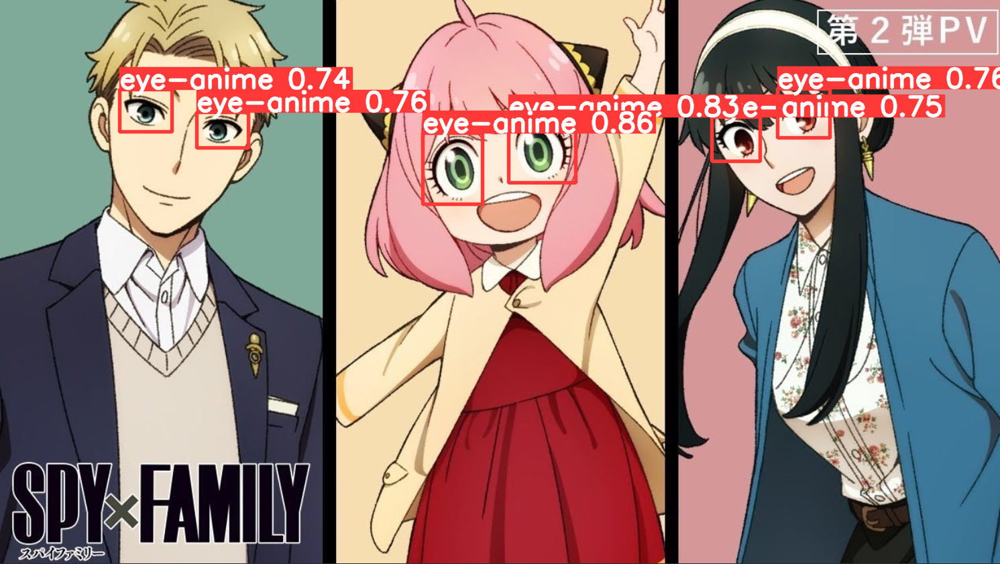

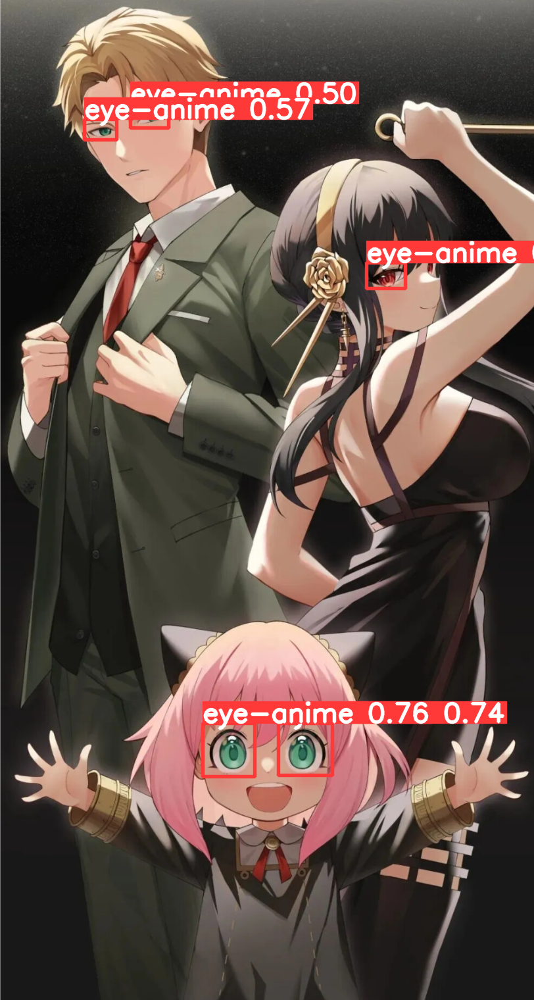

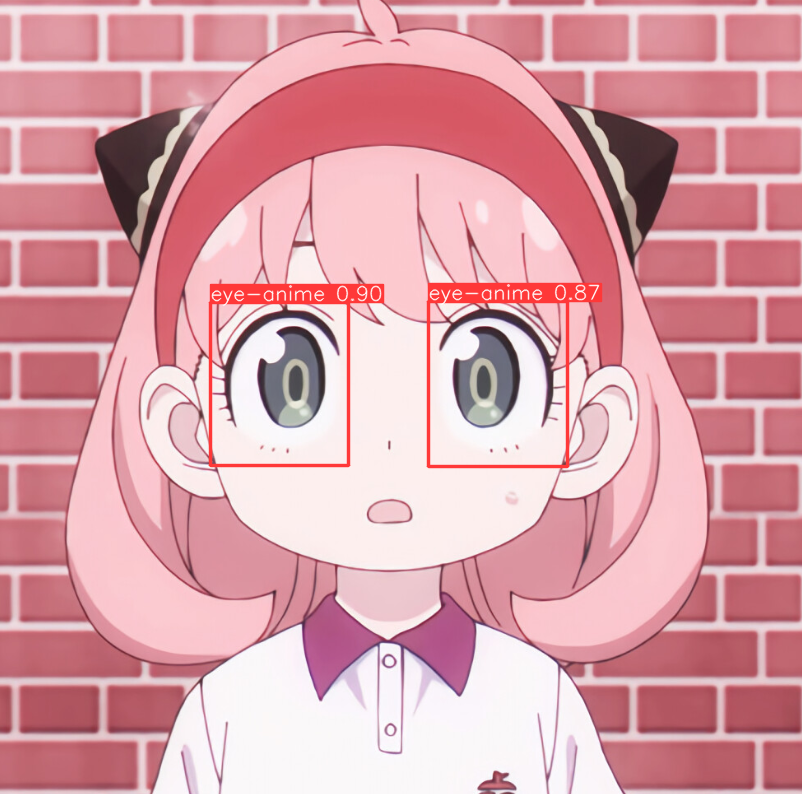

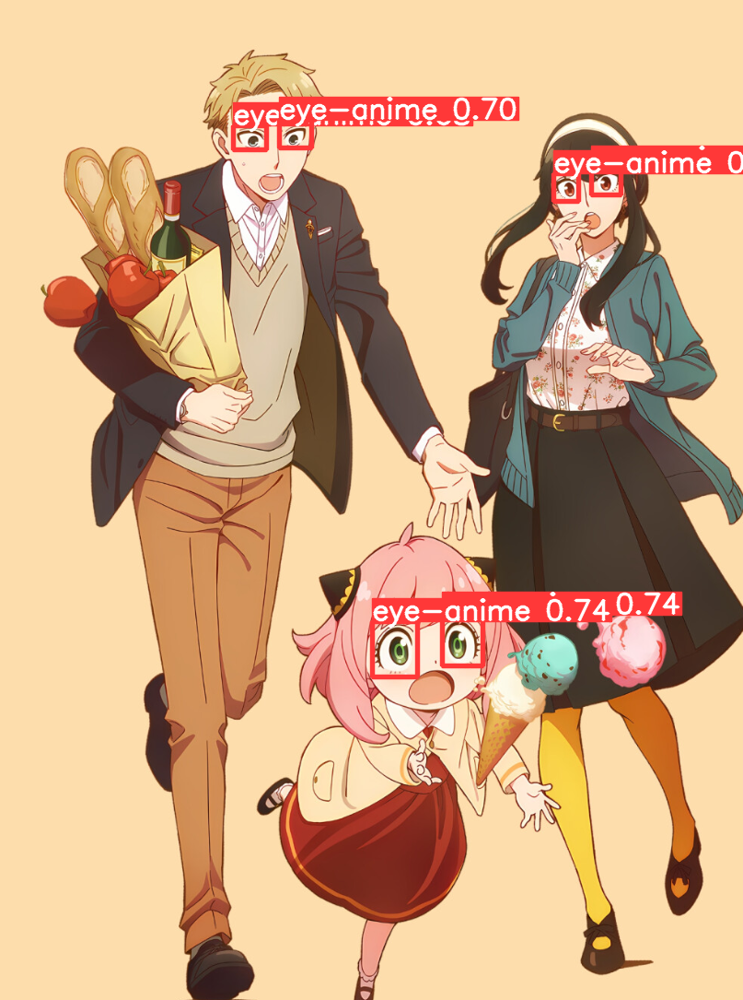

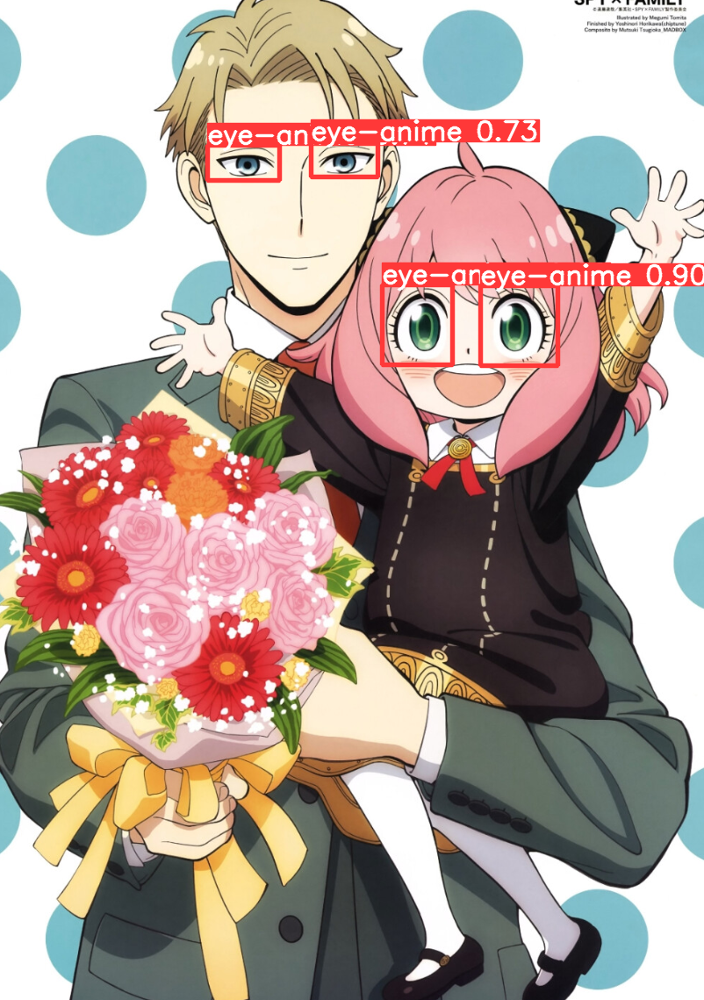

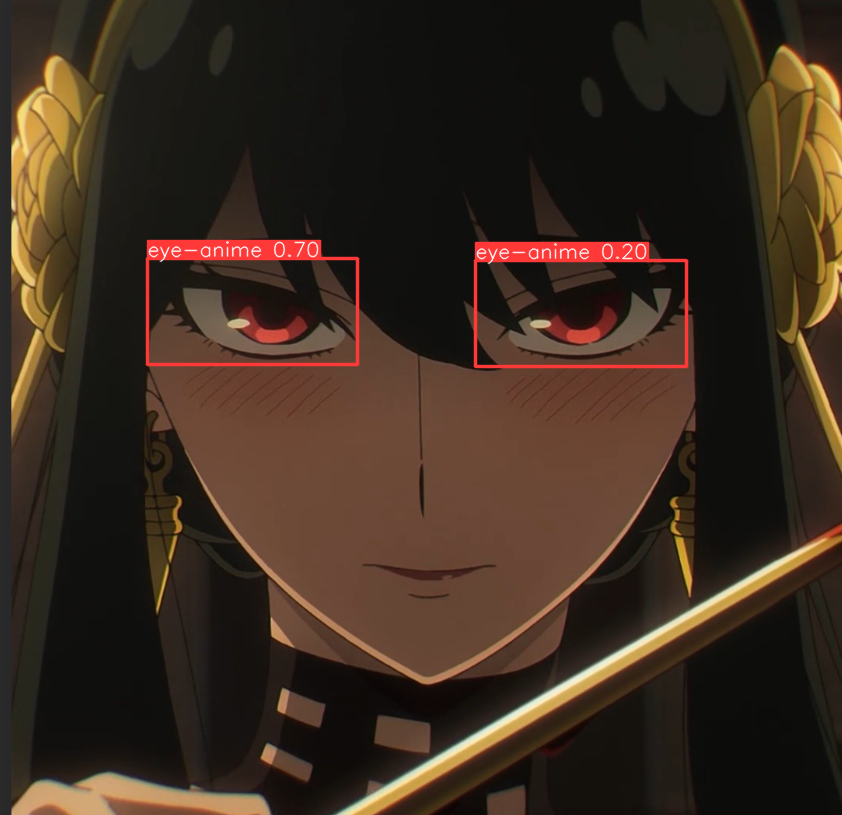

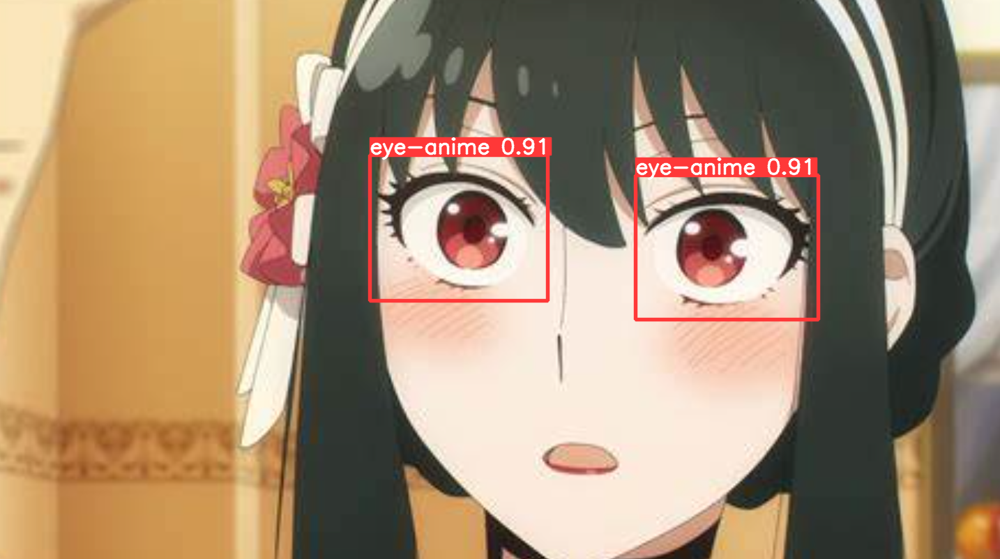

In [23]:
import os
from datetime import datetime
from ultralytics import YOLO
from PIL import Image
from IPython.display import display
import time

# Create the 'results' directory if it doesn't exist
results_dir = '/content/results'
if not os.path.exists(results_dir):
    os.makedirs(results_dir)

# Create a subdirectory based on the current timestamp for this run
timestamp = datetime.now().strftime('%Y%m%d-%H%M%S')
run_dir = os.path.join(results_dir, timestamp)
os.makedirs(run_dir)

# Load the pre-trained YOLOv8n model
model = YOLO('runs/detect/train/weights/best.pt')

# Run inference on the specified folder
start_time = time.time()
results = model('/content/data',conf=0.19)  # List of results
# results = model('/content/both-eyes-anime-2/test/images',conf=0.4)  # List of results
end_time = time.time()

print(f'Time used: {(end_time - start_time)/8} second')


# List to store bounding boxes for all images
bbox_list = []


for i, r in enumerate(results):

    current_bboxes = r.boxes.xyxy.cpu().numpy()

    # Add the bounding box list for the current image to bbox_list
    bbox_list.append(current_bboxes)

    # Other processing...
    im_array = r.plot()
    im = Image.fromarray(im_array[..., ::-1])  # Convert to an RGB PIL image

    # Create a unique file name for each image
    result_filename = os.path.join(run_dir, f'results_{i}.jpg')

    # Display the image
    display(im)

    # Save the image
    im.save(result_filename)

The result seems acceptable, looks like it is not good at amime eyes that covered with hair.

**However, the speed of it is really fast, take around 10ms to finish the detection**

#Add Segment

 bbox_list now contains bounding boxes for all images

In [24]:
from ultralytics import SAM

# Load the SAM model
model = SAM('sam_b.pt')  # Make sure to use the correct model path

# Specify the folder path
folder_path = '/content/data/'

# Get the names of all files in the folder
file_names = os.listdir(folder_path)

# Ensure that bbox_list matches the number of images
assert len(bbox_list) == len(file_names), "bbox_list length does not match the number of images"

# Iterate through each image file and its corresponding bounding box
for i, file_name in enumerate(sorted(file_names)):
    image_path = os.path.join(folder_path, file_name)

    # Perform segmentation using the corresponding bounding box
    results = model(image_path, bboxes=bbox_list[i], save=True)



image 1/1 /content/data/miss_yolu1.png: 1024x1024 443.5ms
Speed: 5.3ms preprocess, 443.5ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict4

image 1/1 /content/data/miss_yolu2.png: 1024x1024 424.2ms
Speed: 5.7ms preprocess, 424.2ms inference, 0.5ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict4

image 1/1 /content/data/miss_yolu3.png: 1024x1024 420.4ms
Speed: 5.5ms preprocess, 420.4ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict4

image 1/1 /content/data/miss_yolu4.png: 1024x1024 411.2ms
Speed: 5.5ms preprocess, 411.2ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict4

image 1/1 /content/data/miss_yolu5.png: 1024x1024 449.9ms
Speed: 5.6ms preprocess, 449.9ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict4

image 1/1

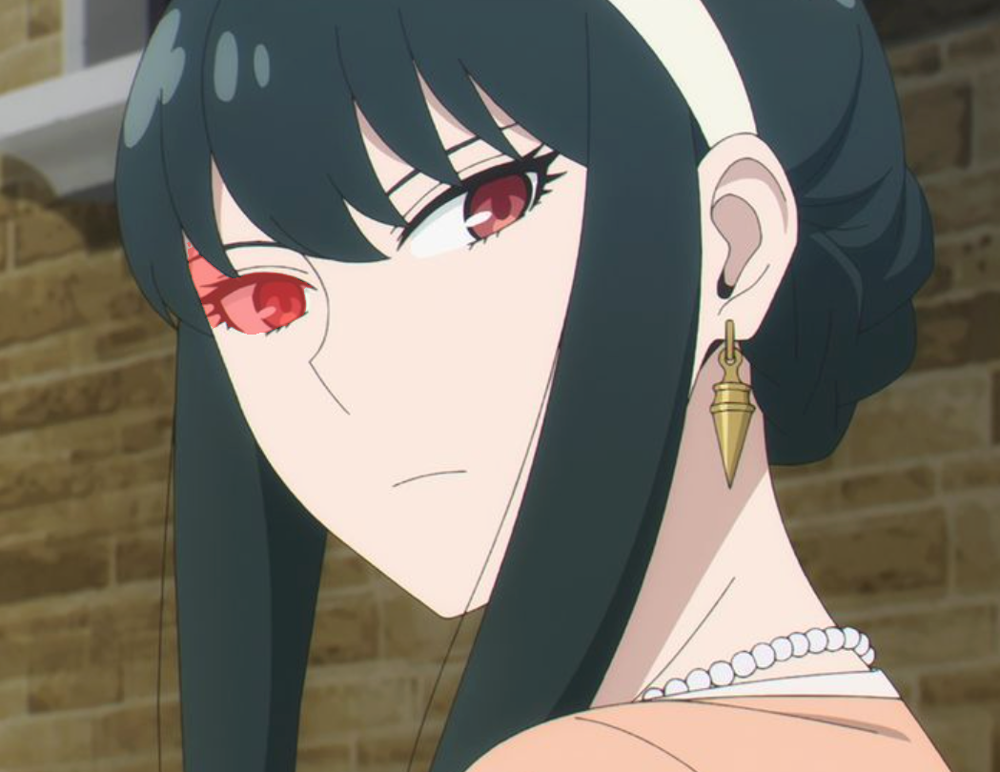

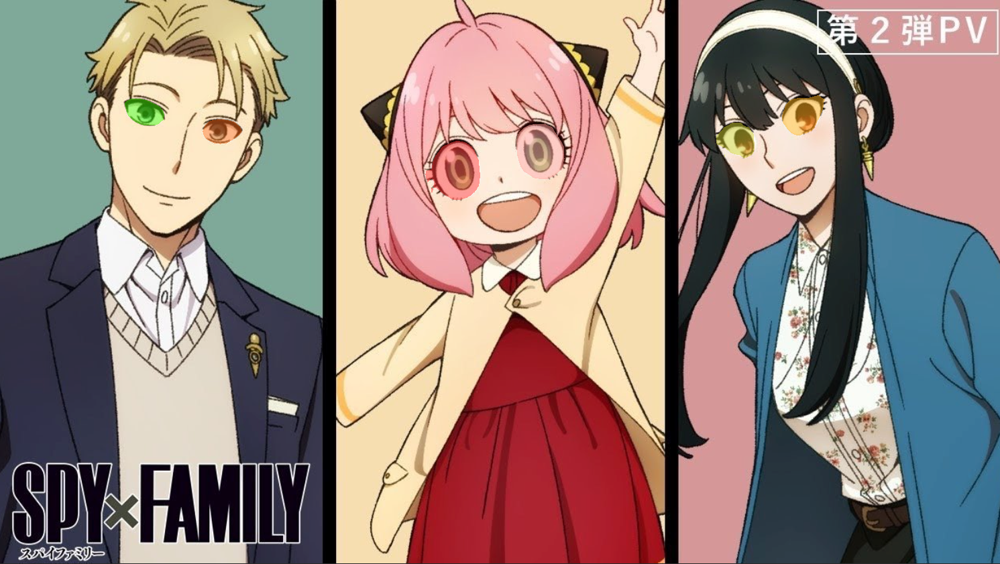

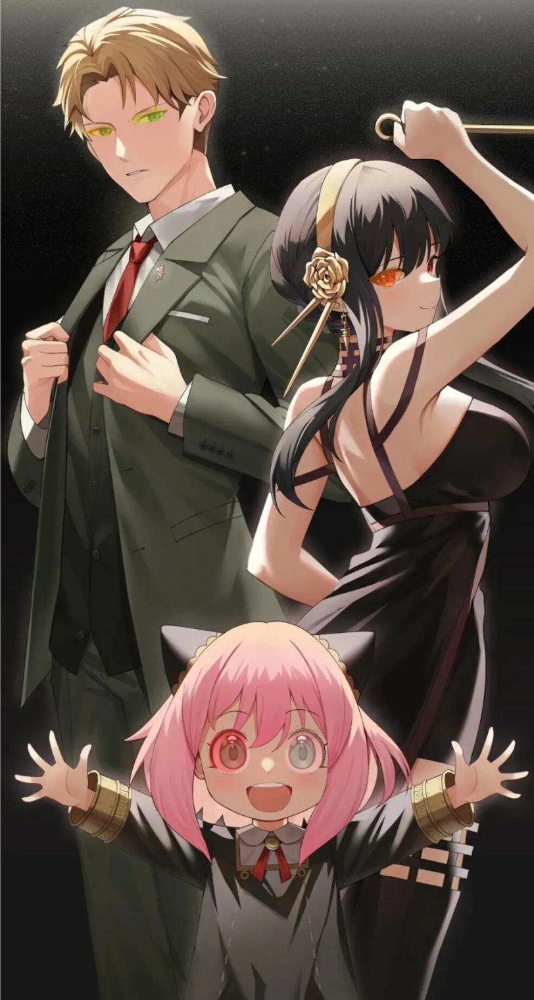

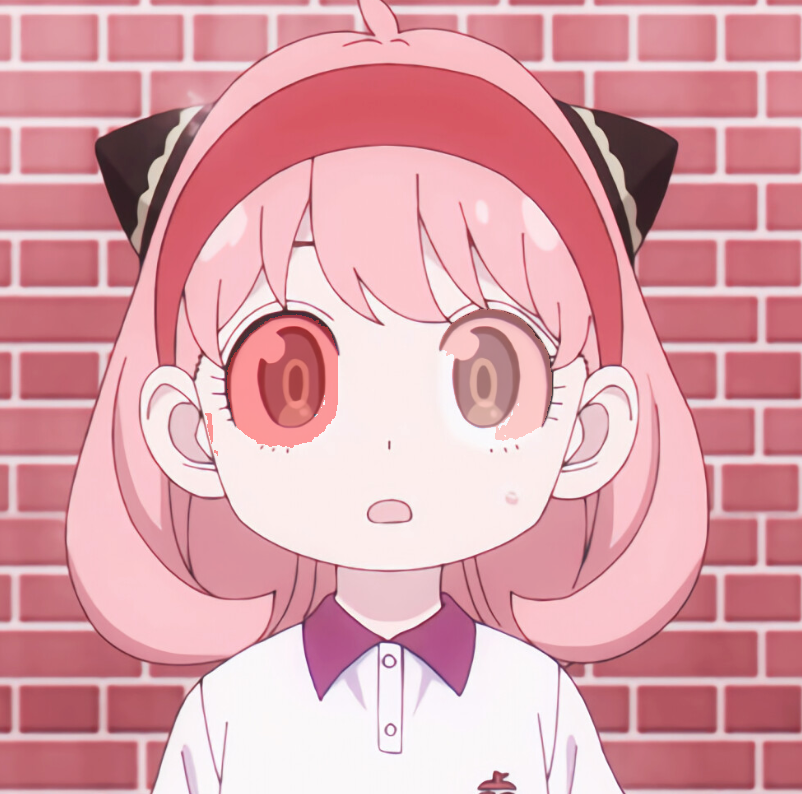

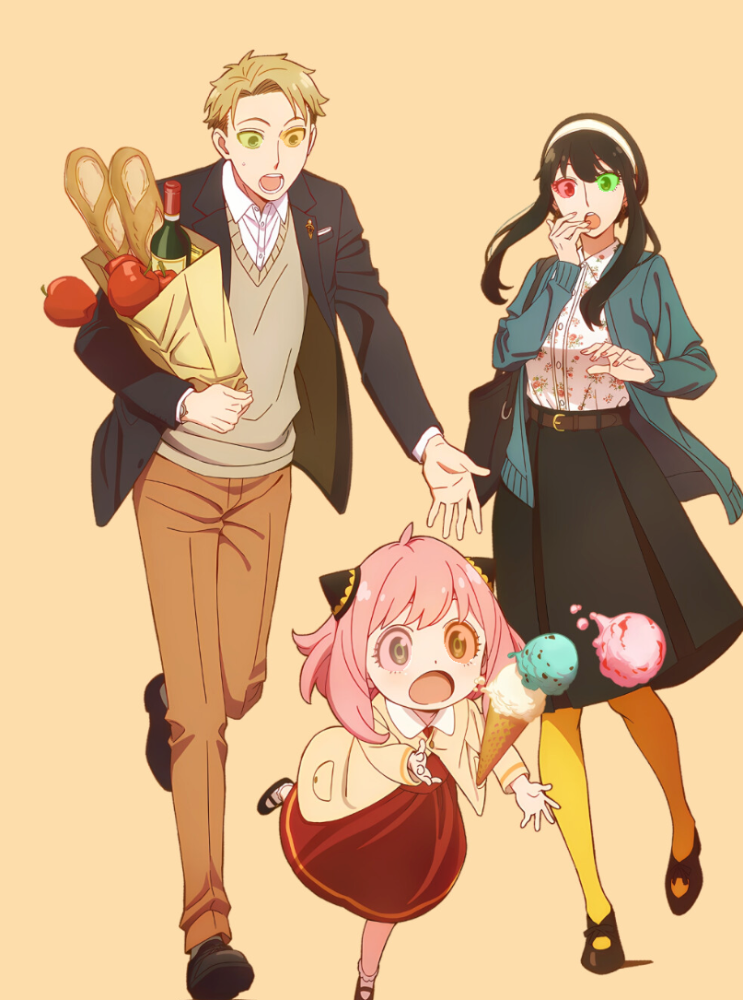

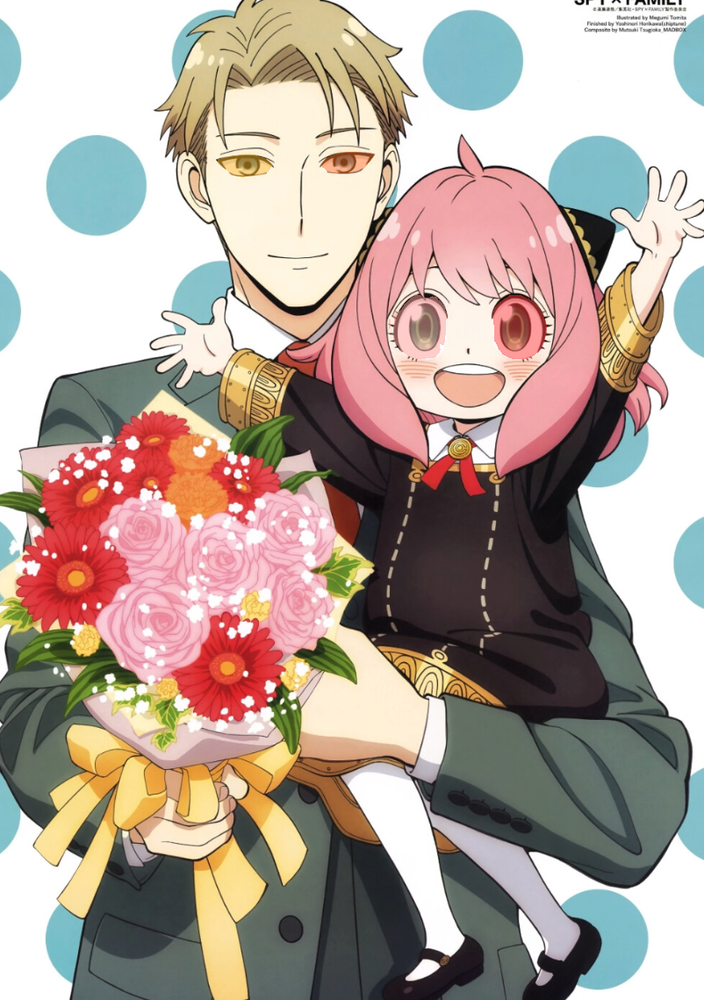

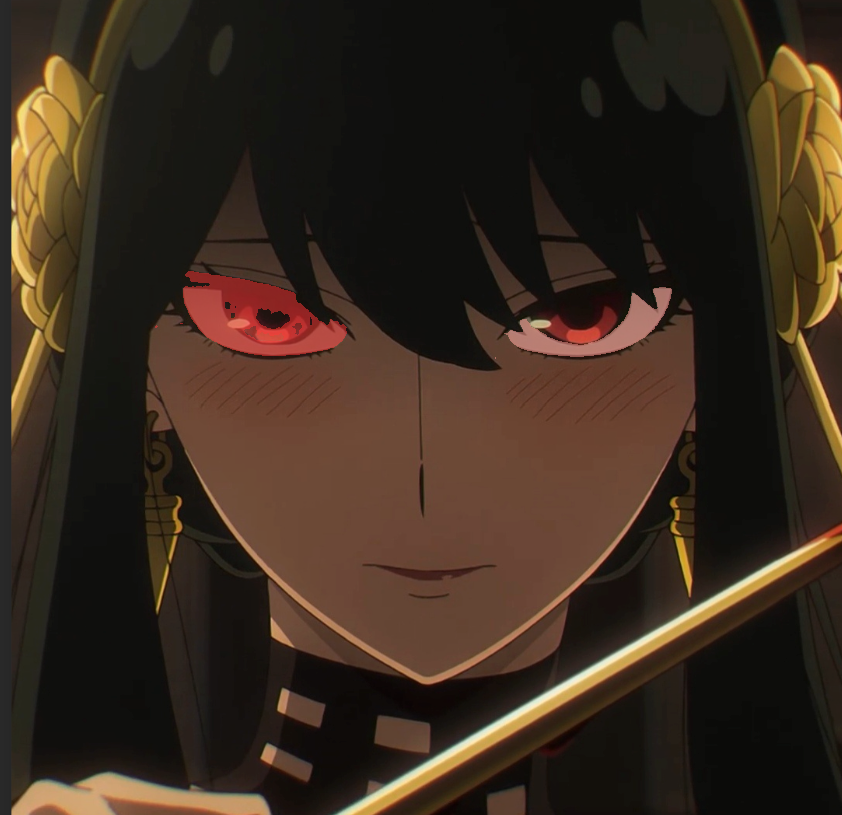

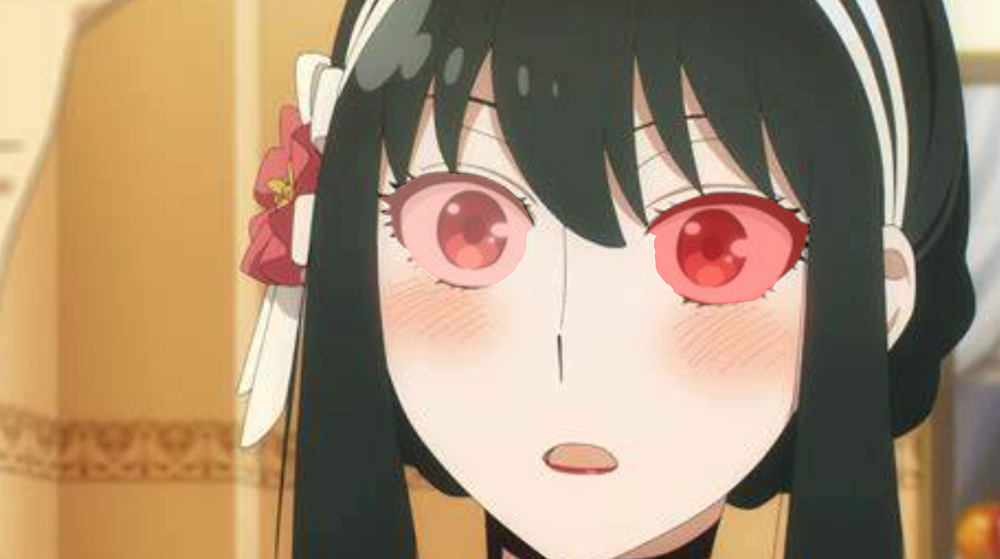

In [25]:
from IPython.display import Image, display
import os

segment_output_dir = 'runs/segment/predict'

file_names = os.listdir(segment_output_dir)

# Sort the file names to maintain order (if needed)
file_names = sorted(file_names)

# Display each image in the directory
for file_name in file_names:
    # Construct the full path to the image file
    file_path = os.path.join(segment_output_dir, file_name)

    # Check if it is a file before trying to display it
    if os.path.isfile(file_path):
        # Display the image
        display(Image(filename=file_path))